# Fraud Detection:-

# Agenda

- Business Understanding
- Loading all the required libraries
- Data Understanding
- Data Preparation
- Exploratory Data Analysis
- visualizations

# Business Understanding

Here is a large US electrical appliances’ retailer with many branches. Salesmen are given freedom to set the price at which they sell the products and also quantity of products based on various factors.  It means, for a single product, some salesmen may sell at a price higher/lower than others for some reasons. Similarly, constraint in terms of maximum or minimum quantity is not imposed. Thus, the average sale size and average quantity sold differ from transaction to transaction. These salespeople sell a set of products of the company and report these sales with a certain periodicity to the company. The data of transactions reported by the salespeople of the company over a short period of time is used for sales and productivity analysis. The data is of an undisclosed source and has been anonymized. Each row of data table includes information on one report by a salesman. This information includes his ID, report ID, product ID, the quantity and the total value reported by the salesman.

# Loading all Libraries:-

In [600]:
import pandas as pd
import numpy as np
import os
from sklearn.preprocessing import Imputer
from sklearn.preprocessing import  StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import learning_curve
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt
from sklearn import tree
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import recall_score
#import squarify # for tree maps
path = os.getcwd()
from plotly.offline import init_notebook_mode, iplot, plot
os.chdir(path)
init_notebook_mode(connected=True)
from xgboost import XGBClassifier
import seaborn as sns
import plotly
import plotly.offline as pyoff
import plotly.figure_factory as ff

import plotly.graph_objs as go
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

# Loading Data:-

In [601]:
train_data = pd.read_excel("Train.xlsx")

# Data Understanding:-

In [602]:
train_data.head(10)

,ReportID,SalesPersonID,ProductID,Quantity,TotalSalesValue,Suspicious
0,Rep10101,C21116,PR6112,182,1665,indeterminate
1,Rep10102,C21116,PR6112,182,1740,indeterminate
2,Rep10103,C21116,PR6253,101,1040,indeterminate
3,Rep10104,C21116,PR6253,283,4495,No
4,Rep10105,C21116,PR6294,108,1465,indeterminate
5,Rep10106,C21116,PR6253,421,6655,indeterminate
6,Rep10107,C21116,PR6294,117,1860,indeterminate
7,Rep10108,C21116,PR6253,103,1120,indeterminate
8,Rep10109,C21116,PR6112,182,1740,indeterminate
9,Rep10110,C21116,PR6297,150,2300,indeterminate


In [603]:
train_data.tail(10)

,ReportID,SalesPersonID,ProductID,Quantity,TotalSalesValue,Suspicious
42572,Rep52673,C22284,PR6552,553,2310,indeterminate
42573,Rep52674,C22284,PR6486,102831,57945,indeterminate
42574,Rep52675,C22284,PR6600,10684,18605,indeterminate
42575,Rep52676,C22284,PR6552,126,1970,indeterminate
42576,Rep52677,C22284,PR6600,3565,8240,indeterminate
42577,Rep52678,C22284,PR6600,2079,5380,indeterminate
42578,Rep52679,C22284,PR6486,116848,66210,indeterminate
42579,Rep52680,C22284,PR6600,1431,3975,indeterminate
42580,Rep52681,C22284,PR6600,9790,22370,indeterminate
42581,Rep52682,C22284,PR6600,9147,20155,indeterminate


In [604]:
print("Number of rows in train data are :",train_data.shape[0])
print("Number of columns in train data are :",train_data.shape[1])
print("Number of rows in test data are :",train_data.shape[0])
print("Number of columns in test data are :",train_data.shape[1])

Number of rows in train data are : 42582
Number of columns in train data are : 6
Number of rows in test data are : 42582
Number of columns in test data are : 6


In [605]:
train_data.drop("ReportID",axis=1,inplace=True)

In [606]:
train_data.columns

Index(['SalesPersonID', 'ProductID', 'Quantity', 'TotalSalesValue',
       'Suspicious'],
      dtype='object')

In [607]:
train_data.dtypes

SalesPersonID      object
ProductID          object
Quantity            int64
TotalSalesValue     int64
Suspicious         object
dtype: object

In [608]:
type(train_data)

pandas.core.frame.DataFrame

In [609]:
def Count_unique_values(df):
    for i in df:
        print(i,":",df[i].nunique())

In [610]:
Count_unique_values(train_data)

SalesPersonID : 992
ProductID : 593
Quantity : 6493
TotalSalesValue : 7665
Suspicious : 3


In [611]:
num_cols = ["Quantity","TotalSalesValue"]
cat_cols = [i for i in train_data.columns.values if i not in num_cols]
cat_cols.remove('Suspicious')

In [612]:
print(len(num_cols))
print(len(cat_cols))

2
2


In [613]:
# def Convert_Category(df,cat_cols):
#     for col in cat_cols:
#         df[col] = df[col].astype('category')

In [614]:
def Convert_Numeric(df,num_cols):
    for col in num_cols:
        df[col] = df[col].astype('int64')

In [615]:
# Convert_Category(train_data,cat_cols)
Convert_Numeric(train_data,num_cols)

In [616]:
train_data.dtypes

SalesPersonID      object
ProductID          object
Quantity            int64
TotalSalesValue     int64
Suspicious         object
dtype: object

In [617]:
train_data.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
SalesPersonID,42582,992,C21976,1359,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ProductID,42582,593,PR6253,2590,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Quantity,42582,NaN,NaN,NaN,4910.05,98336.2,33,111,206,1136,1.97081e+07
TotalSalesValue,42582,NaN,NaN,NaN,16209.2,59972,598,1345,2980,10765,3.95398e+06
Suspicious,42582,3,indeterminate,39846,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [618]:
train_data1=train_data

In [619]:
train_data["Product_Price"] = train_data["TotalSalesValue"]/train_data["Quantity"]

In [620]:
train_data.head(10)

,SalesPersonID,ProductID,Quantity,TotalSalesValue,Suspicious,Product_Price
0,C21116,PR6112,182,1665,indeterminate,9.148352
1,C21116,PR6112,182,1740,indeterminate,9.560440
2,C21116,PR6253,101,1040,indeterminate,10.297030
3,C21116,PR6253,283,4495,No,15.883392
4,C21116,PR6294,108,1465,indeterminate,13.564815
5,C21116,PR6253,421,6655,indeterminate,15.807601
6,C21116,PR6294,117,1860,indeterminate,15.897436
7,C21116,PR6253,103,1120,indeterminate,10.873786
8,C21116,PR6112,182,1740,indeterminate,9.560440
9,C21116,PR6297,150,2300,indeterminate,15.333333


In [621]:
train_data2 = train_data
d1 = train_data.groupby(['ProductID'])[['Product_Price']].mean()

In [622]:
d1=d1.rename(index=str, columns={"Product_Price" : "Mean_Product_Price"})


In [623]:

train_data = train_data2.join(d1,on= 'ProductID')

In [624]:
d3 = train_data.groupby('ProductID').agg({'Quantity':'mean'})
d3=d3.rename(index=str, columns={'Quantity': 'Avg_SellingQty'})

In [625]:
train_data = train_data.join(d3, on='ProductID')
train_data['Ratio_saleQty_to_AvgSellingQty'] = train_data['Quantity']/train_data['Avg_SellingQty']

In [626]:
train_data.head(10)

,SalesPersonID,ProductID,Quantity,TotalSalesValue,Suspicious,Product_Price,Mean_Product_Price,Avg_SellingQty,Ratio_saleQty_to_AvgSellingQty
0,C21116,PR6112,182,1665,indeterminate,9.148352,14.164825,591.650888,0.307614
1,C21116,PR6112,182,1740,indeterminate,9.560440,14.164825,591.650888,0.307614
2,C21116,PR6253,101,1040,indeterminate,10.297030,16.161482,471.563320,0.214181
3,C21116,PR6253,283,4495,No,15.883392,16.161482,471.563320,0.600131
4,C21116,PR6294,108,1465,indeterminate,13.564815,20.898267,224.248227,0.481609
5,C21116,PR6253,421,6655,indeterminate,15.807601,16.161482,471.563320,0.892775
6,C21116,PR6294,117,1860,indeterminate,15.897436,20.898267,224.248227,0.521743
7,C21116,PR6253,103,1120,indeterminate,10.873786,16.161482,471.563320,0.218422
8,C21116,PR6112,182,1740,indeterminate,9.560440,14.164825,591.650888,0.307614
9,C21116,PR6297,150,2300,indeterminate,15.333333,22.149449,289.200837,0.518671


# Plotting

In [627]:
co= train_data['Suspicious'].value_counts()
percentage=co/42582*100

## Pie Chart:-

In [628]:
percentage

indeterminate    93.574750
No                6.000188
Yes               0.425062
Name: Suspicious, dtype: float64

In [629]:
labels = ["Indeterminate","No","Yes"]
values = percentage

trace = go.Pie(labels=labels, values=values)

layout = go.Layout(title = 'Suspicious Class Distribution')
data = [trace]
fig = go.Figure(data= data,layout=layout)
iplot(fig)

In [630]:
train_data.groupby('Suspicious').agg({'Quantity' : 'sum','TotalSalesValue' : 'sum'})

,Quantity,TotalSalesValue
Suspicious,,
No,33854479,132511374
Yes,24881655,17346509
indeterminate,150343545,540363544


## Bar Plot:-

In [631]:
d1=train_data.groupby(['SalesPersonID','ProductID']).agg({'ProductID':'count'})
d1=d1.groupby(['SalesPersonID']).agg({'ProductID':'sum'})
d1=d1.sort_values('ProductID',ascending=False).head(10)
d1

,ProductID
SalesPersonID,
C21976,1359
C22030,525
C21898,508
C21636,488
C22322,476
C21864,435
C22185,397
C21453,383
C22339,372


In [632]:
trace1 = [go.Bar(
                x= d1.index,
                y= d1.ProductID,
                text = d1.ProductID,
                textposition = 'auto',
                
        )]
layout = go.Layout(
        autosize=True,
        title = " Salespersons Vs Number of Suspicous Transactions",
        xaxis=dict(title="SalespersonID"),
        yaxis=dict(title="Number of Suspicious Transactions")
    )

fig = go.Figure(data=trace1, layout=layout)
iplot(fig)

#### Sum of TotalSalesValue Grouped By ProductID:-

In [633]:
d0 = train_data[train_data.Suspicious== 'Yes'].groupby(['ProductID'])[['TotalSalesValue']].sum()


In [634]:
d0 = d0.sort_values(by=['TotalSalesValue'],ascending=False).head(10)

In [635]:
trace1 = go.Bar(y = d0.TotalSalesValue,
               x = d0.index,
                text = d0.TotalSalesValue,
                #text = ['{}%'.format(i) for i in np.round(temp.values.astype(float)/temp.values.sum(),4)*100],
    # text to be displayed on the bar, we are doing this to display the '%' symbol along with the number on the bar
                textposition = 'auto',
              )
data = [trace1]
# these are used to define the layout options

layout = go.Layout(width=1000, height=1000,title="Sum of TotalSalesValue Grouped By ProductID",
                   xaxis=dict( 
                  title='ProductID',
                    titlefont=dict(
                        size=14,
                        color='black'
            ),
        tickfont=dict(
            family='Courier New, monospace', # font family
            size=14, # size of ticks displayed on the x axis
            color='black'  # color of the font
            )
        ),
       yaxis=dict(
#         range=[0,100],
            title='TotalSalesValue',
            titlefont=dict(
                size=14,
                color='black'
            ),
        tickfont=dict(
            family='Courier New, monospace', # font family
            size=14, # size of ticks displayed on the y axis
            color='black' # color of the font
            )
        ))

fig = go.Figure(data=data, layout=layout)
iplot(fig)

### Notice:-PR6290 has abnormally high totalsale

In [636]:
data = train_data[train_data.Suspicious == 'Yes']
data[data.ProductID == 'PR6290'].groupby(['SalesPersonID', 'ProductID','Suspicious']).head(10)

,SalesPersonID,ProductID,Quantity,TotalSalesValue,Suspicious,Product_Price,Mean_Product_Price,Avg_SellingQty,Ratio_saleQty_to_AvgSellingQty
28728,C22304,PR6290,350,3953985,Yes,11297.1,209.911386,124.982759,2.800386


- Here we can notice that there is huge desparity between 'Product_Price' and 'Mean_Product_Price' for transactions done by 'SalesPersonID' #C22304 for 'ProductID' # PR6290.
- Also we can notice that selling quantity is almost double of that 'Avg_SellingQty'.

#### Sum of TotalSalesValue Grouped By SalesPersonID:-

In [637]:
d1 = train_data[train_data.Suspicious== 'Yes'].groupby(['SalesPersonID'])[['TotalSalesValue']].sum()

In [638]:
d1 = d1.sort_values(by=['TotalSalesValue'],ascending=False).head(10)

In [639]:
trace1 = go.Bar(y = d1.TotalSalesValue,
               x = d1.index,
                text=d1.TotalSalesValue,
                #text = ['{}%'.format(i) for i in np.round(temp.values.astype(float)/temp.values.sum(),4)*100],
    # text to be displayed on the bar, we are doing this to display the '%' symbol along with the number on the bar
                textposition = 'auto',)
data = [trace1]
# these are used to define the layout options

layout = go.Layout(width=1000, height=1000,title="Sum of TotalSalesValue Grouped By SalesPersonID",
                   xaxis=dict( 
                  title='SalesPersonID',
                    titlefont=dict(
                        size=14,
                        color='black'
            ),
        tickfont=dict(
            family='Courier New, monospace', # font family
            size=14, # size of ticks displayed on the x axis
            color='black'  # color of the font
            )
        ),
       yaxis=dict(
#         range=[0,100],
            title='TotalSalesValue',
            titlefont=dict(
                size=14,
                color='black'
            ),
        tickfont=dict(
            family='Courier New, monospace', # font family
            size=14, # size of ticks displayed on the y axis
            color='black' # color of the font
            )
        ))

fig = go.Figure(data=data, layout=layout)
iplot(fig)

### Notice:-C22304 salesperson has abnormally high totalsale.

In [640]:
data = train_data[train_data.Suspicious == 'Yes']
data[data.SalesPersonID == 'C22304'].groupby(['SalesPersonID', 'ProductID','Suspicious']).head(10)

,SalesPersonID,ProductID,Quantity,TotalSalesValue,Suspicious,Product_Price,Mean_Product_Price,Avg_SellingQty,Ratio_saleQty_to_AvgSellingQty
28728,C22304,PR6290,350,3953985,Yes,11297.1,209.911386,124.982759,2.800386


- Here we can notice that there is huge desparity between 'Product_Price' and 'Mean_Product_Price' for transactions done by 'SalesPersonID' #C22304.
- Also we can notice that selling quantity is almost double of that 'Avg_SellingQty'.

#### Sum of TotalSalesValue Grouped By SalesPersonID and ProductID

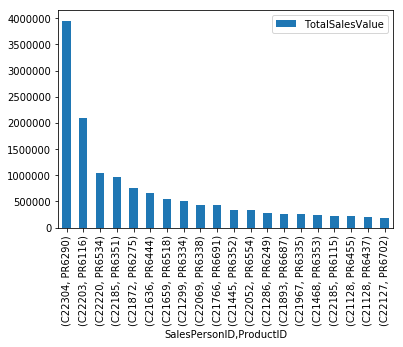

In [641]:
d2 = train_data[train_data.Suspicious== 'Yes'].groupby(['SalesPersonID','ProductID'])[['TotalSalesValue']].sum()
d2.sort_values(by=['TotalSalesValue'],ascending=False).head(20).plot(kind='bar')

### Notice:- C22304 and PR6290 salesperson has abnormally high totalsale.

- This chart confirms our suspucion from the above two charts.

#### Sum of Quantity Grouped By SalesPersonID

In [642]:
d1 = train_data[train_data.Suspicious== 'Yes'].groupby(['SalesPersonID'])[['Quantity']].sum()

In [643]:
d1 = d1.sort_values(by=['Quantity'],ascending=False).head(10)

In [644]:
trace1 = go.Bar(y = d1.Quantity,
               x = d1.index,
                text=d1.Quantity,
                #text = ['{}%'.format(i) for i in np.round(temp.values.astype(float)/temp.values.sum(),4)*100],
    # text to be displayed on the bar, we are doing this to display the '%' symbol along with the number on the bar
                textposition = 'auto',)
data = [trace1]
# these are used to define the layout options

layout = go.Layout(width=1000, height=1000,title="Sum of Quantity Grouped By SalesPersonID",
                   xaxis=dict( 
                  title='SalesPersonID',
                    titlefont=dict(
                        size=14,
                        color='black'
            ),
        tickfont=dict(
            family='Courier New, monospace', # font family
            size=14, # size of ticks displayed on the x axis
            color='black'  # color of the font
            )
        ),
       yaxis=dict(
#         range=[0,100],
            title='Quantity',
            titlefont=dict(
                size=14,
                color='black'
            ),
        tickfont=dict(
            family='Courier New, monospace', # font family
            size=14, # size of ticks displayed on the y axis
            color='black' # color of the font
            )
        ))

fig = go.Figure(data=data, layout=layout)
iplot(fig)

### Notice:-C21992 salesperson has abnormally high Quantity.

In [645]:
data = train_data[train_data.Suspicious == 'Yes']
data[data.SalesPersonID == 'C21992'].groupby(['SalesPersonID', 'ProductID','Suspicious']).head(10)

,SalesPersonID,ProductID,Quantity,TotalSalesValue,Suspicious,Product_Price,Mean_Product_Price,Avg_SellingQty,Ratio_saleQty_to_AvgSellingQty
24091,C21992,PR6550,458846,10750,Yes,0.023428,10.420514,137016.263158,3.348843
24092,C21992,PR6550,19708130,136860,Yes,0.006944,10.420514,137016.263158,143.837889
24094,C21992,PR6551,35543,2015,Yes,0.056692,9.352135,11472.437500,3.098121
24107,C21992,PR6551,259217,8215,Yes,0.031692,9.352135,11472.437500,22.594762


- Here we can notice that 'Ratio_saleQty_to_AvgSellingQty' is very high for every transaction.
- Where 'ProductID' is # PR6550 'Ratio_saleQty_to_AvgSellingQty' is 143.83.
- 'Product_Price' and  'Mean_Product_Price' also vary verymuch for all transactions.

#### Sum of Quantity Grouped By ProductID:-

In [646]:
d1 = train_data[train_data.Suspicious== 'Yes'].groupby(['ProductID'])[['Quantity']].sum()

In [647]:
d1 = d1.sort_values(by=['Quantity'],ascending=False).head(10)

In [648]:
trace1 = go.Bar(y = d1.Quantity,
               x = d1.index,
                text=d1.Quantity,
                #text = ['{}%'.format(i) for i in np.round(temp.values.astype(float)/temp.values.sum(),4)*100],
    # text to be displayed on the bar, we are doing this to display the '%' symbol along with the number on the bar
                textposition = 'auto',)
data = [trace1]
# these are used to define the layout options

layout = go.Layout(width=1000, height=1000,title="Sum of Quantity Grouped By ProductID",
                   xaxis=dict( 
                  title='ProductID',
                    titlefont=dict(
                        size=14,
                        color='black'
            ),
        tickfont=dict(
            family='Courier New, monospace', # font family
            size=14, # size of ticks displayed on the x axis
            color='black'  # color of the font
            )
        ),
       yaxis=dict(
#         range=[0,100],
            title='Quantity',
            titlefont=dict(
                size=14,
                color='black'
            ),
        tickfont=dict(
            family='Courier New, monospace', # font family
            size=14, # size of ticks displayed on the y axis
            color='black' # color of the font
            )
        ))

fig = go.Figure(data=data, layout=layout)
iplot(fig)

In [649]:
data = train_data[train_data.Suspicious == 'Yes']
data[data.ProductID == 'PR6550'].groupby(['SalesPersonID', 'ProductID','Suspicious']).head(10)

,SalesPersonID,ProductID,Quantity,TotalSalesValue,Suspicious,Product_Price,Mean_Product_Price,Avg_SellingQty,Ratio_saleQty_to_AvgSellingQty
24091,C21992,PR6550,458846,10750,Yes,0.023428,10.420514,137016.263158,3.348843
24092,C21992,PR6550,19708130,136860,Yes,0.006944,10.420514,137016.263158,143.837889
29723,C21853,PR6550,72877,2480,Yes,0.034030,10.420514,137016.263158,0.531886


- This further confirms our observation from above chart.

#### Sum of Quantity Grouped By ProductID:-

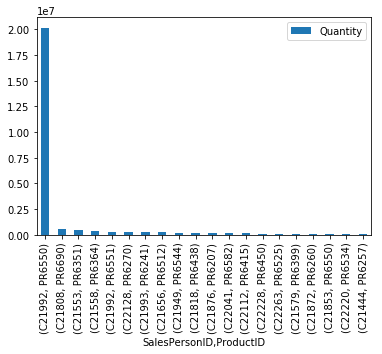

In [650]:
d2 = train_data[train_data.Suspicious== 'Yes'].groupby(['SalesPersonID','ProductID'])[['Quantity']].sum()
d2.sort_values(by=['Quantity'],ascending=False).head(20).plot(kind='bar')

- This chart confirms our suspucion from the above two charts.

## Scatter Plot:-

####  SalesPersonID VS TotalSalesValue distribution:-

In [651]:
trace = go.Scatter(y=train_data.TotalSalesValue ,
                  x= train_data.SalesPersonID,
                  mode= 'markers')
data = [trace]
layout = go.Layout(width=1000, height=800,title = ' SalesPersonID and TotalSalesValue distribution',
                  xaxis = dict(title = 'SalesPersonID'),
                  yaxis = dict(title = 'TotalSalesValue'))
fig = go.Figure(data=data,layout=layout)
iplot(fig)

- From this also we know that 'SalesPersonID' # 22304 is anomaly.

#### ProductID Vs TotalSalesValue distribution:-

In [652]:
trace = go.Scatter(y=train_data.TotalSalesValue ,
                  x= train_data.ProductID,
                  mode= 'markers')
data = [trace]
layout = go.Layout(width=1000, height=800,title = ' ProductID and TotalSalesValue distribution',
                  xaxis = dict(title = 'ProductID'),
                  yaxis = dict(title = 'TotalSalesValue'))
fig = go.Figure(data=data,layout=layout)
iplot(fig)

- From this also we know that 'ProductID' # 6290 is anomaly.

####  SalesPersonID Vs Quantity distribution:-

In [653]:
trace = go.Scatter(y=train_data.Quantity ,
                  x= train_data.SalesPersonID,
                  mode= 'markers')
data = [trace]
layout = go.Layout(width=1000, height=800,title = ' SalesPersonID and Quantity distribution',
                  xaxis = dict(title = 'SalesPersonID'),
                  yaxis = dict(title = 'Quantity'))
fig = go.Figure(data=data,layout=layout)
iplot(fig)

- From this also we know that 'SalesPersonID' # 21992 is anomaly.

####  ProductID Vs Quantity distribution:-

In [654]:
trace = go.Scatter(y=train_data.Quantity ,
                  x= train_data.ProductID,
                  mode= 'markers')
data = [trace]
layout = go.Layout(width=1000, height=800,title = ' ProductID and Quantity distribution',
                  xaxis = dict(title = 'ProductID'),
                  yaxis = dict(title = 'Quantity'))
fig = go.Figure(data=data,layout=layout)
iplot(fig)

- From this also we know that 'ProductID' # 6290 is anomaly.

# Observation:-

- From above data exploreation and visualisation we found some observation.
- There are some anomalies in the data as explained above,we need to explore more about those points and check their validity.
- We also found that the data is imbalanced.We need to do either "Up sampling" or "Down Sampling".
- The data has very less attributes.We need to use feature engineering and other techniques to add some other features.
- We have added some new features like Product_Price,Mean_Product_Price Avg_SellingQty,Ratio_saleQty_to_AvgSellingQty.